<a href="https://colab.research.google.com/github/aubricot/object_detection_for_image_cropping/blob/master/coordinates_display_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Display box coordinates resulting from object detection or image augmentation on images
---
*Last Updated 15 January 2020*   
Use this notebook to verify the coordinates resulting from either object detection or image augmentation. If results aren't as expected, data reformatting and tidying steps in convert_bboxdims.py or image_aug_training_yolo.ipynb can be adjusted and results re-displayed accordingly.

__Coordinates from object detection__: Bounding boxes resulting from object detection using YOLO were exported from object_detection_for_image_cropping_yolo.ipynb, then converted to square dimensions and padded to be used as crop coordinates for EOL images using convert_bboxdims.py. Crop coordinates were exported to bird_crops_yolo_1000img_display_test.tsv and should be imported to your Google Drive for upload to this notebook.

__Coordinates from augmentation__: Bounding boxes resulting from augmentation of EOL user-generated cropping coordinates and images were tidied and exported from image_aug_training_yolo.ipynb to chiroptera_crops_all_transf.tsv and should be imported to your Google Drive for upload to this notebook. 

This notebook is meant to be run enitrely in Google Colab and doesn't require any software installations or downloads to your local machine. To get started, just click the "Open in Colab" button. 

## Imports
---


In [0]:
# For importing data and images
import numpy as np 
import pandas as pd
import urllib

# For drawing on and displaying images
import cv2
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'svg'

##Load in crop coordinates from Google Drive
---

In [2]:
# Mount Google Drive to import your file containing coordinates (object detection bounding boxes, cropping coordinates, etc.)
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
# Import your file containining coordinates from Google Drive
# Note: First you need to upload the file to your Google Drive, then adjust the path accordingly
df = pd.read_csv('/content/drive/My Drive/[your path here]', sep='\t', header=0)
print(df.head())

   data_object_id  ...        name
0        31356195  ...  Chiroptera
1        31364170  ...  Chiroptera
2        27320132  ...  Chiroptera
3        23364248  ...  Chiroptera
4        27111698  ...  Chiroptera

[5 rows x 11 columns]


## Display crop dimensions on images
---

In [0]:
# For uploading an image from url
# Modified from https://www.pyimagesearch.com/2015/03/02/convert-url-to-image-with-python-and-opencv/
def url_to_image(url):
  resp = urllib.request.urlopen(url)
  image = np.asarray(bytearray(resp.read()), dtype="uint8")
  image = cv2.imdecode(image, cv2.IMREAD_COLOR)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
 
  return image

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


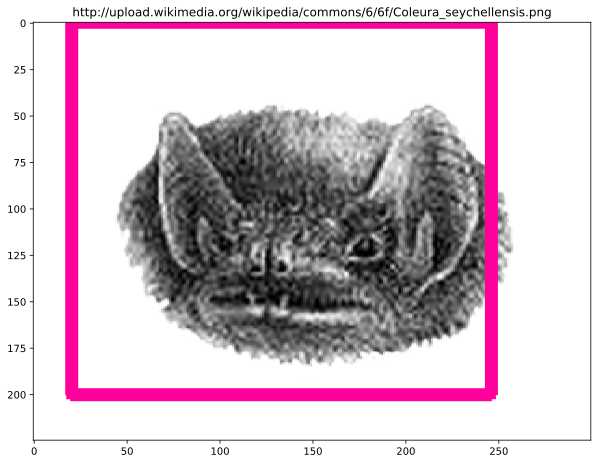

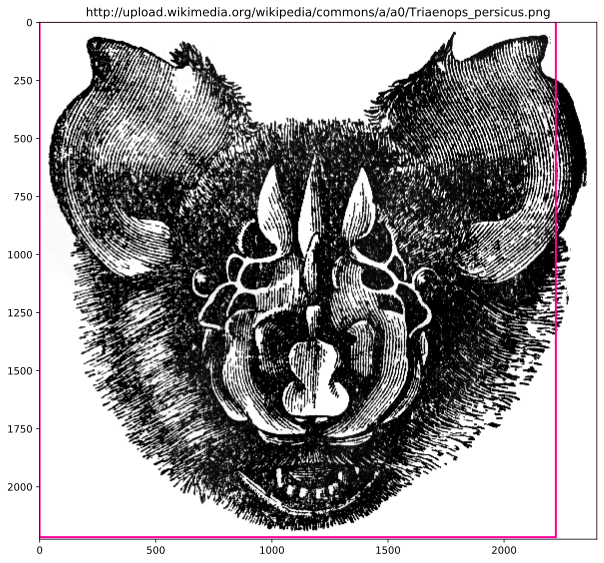

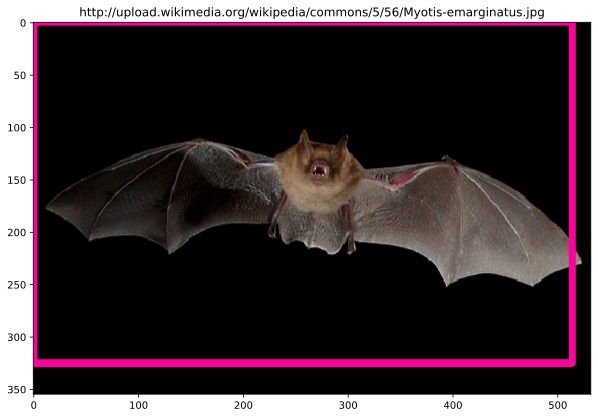

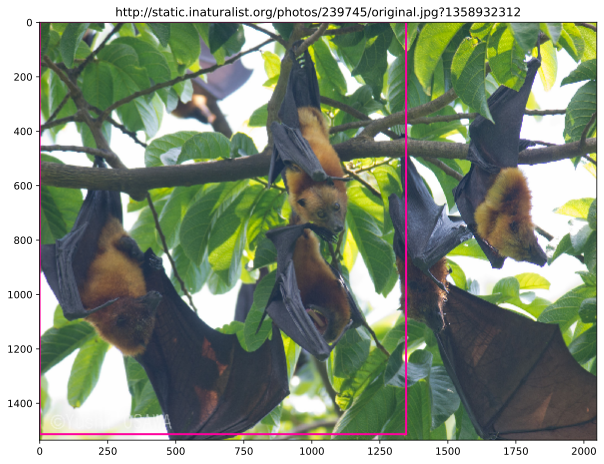

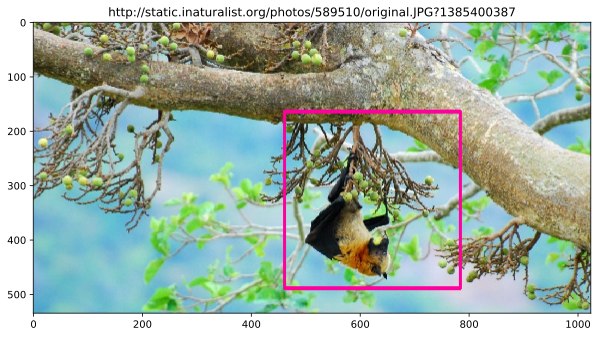

...

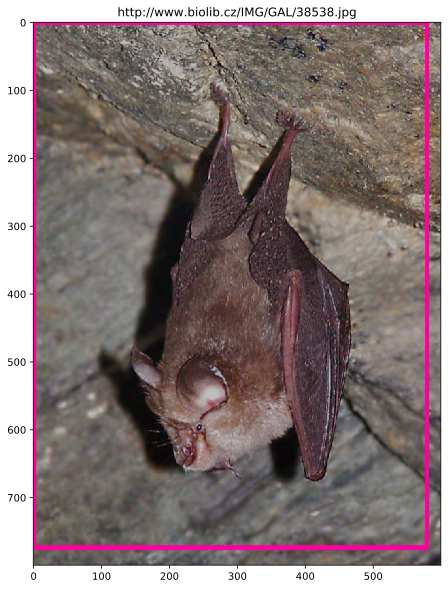

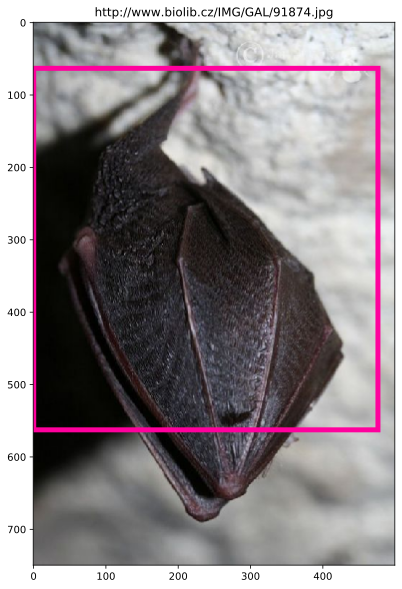

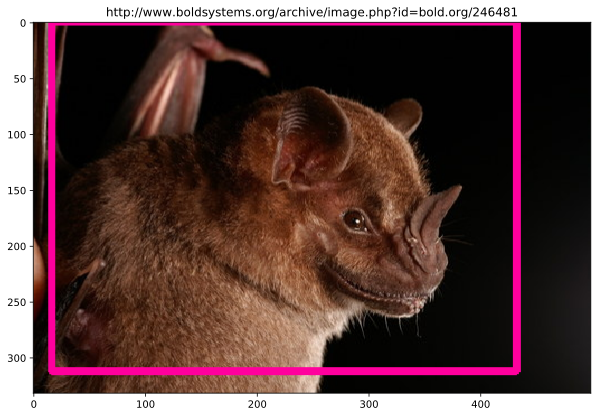

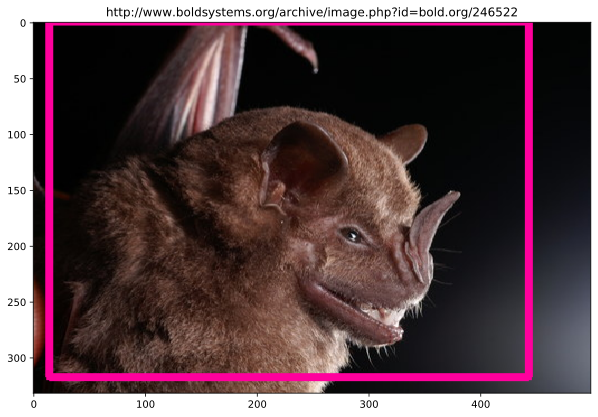

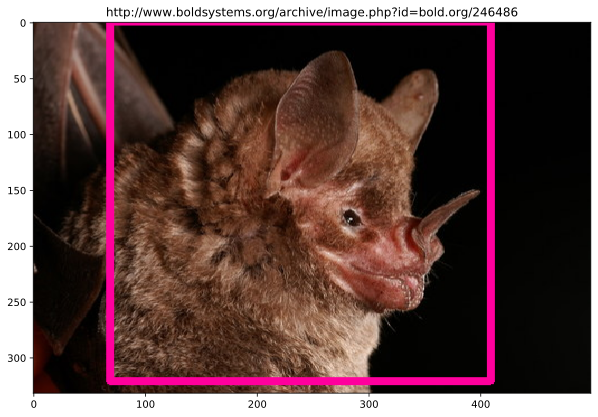

In [5]:
# Display crop dimensions on images
# Adjust line below to see up to 50 images displayed at a time
for i, row in df.head(30).iterrows():
  # Read in image 
  url = df['obj_url'][i]
  img = url_to_image(url)

  # Draw box on image
  # Last values listed adjust color (255, 0, 157) and line thickness (5)
  image_wbox = cv2.rectangle(img, (df['xmin'][i].astype(int), df['ymin'][i].astype(int)), 
                             (df['xmax'][i].astype(int), df['ymax'][i].astype(int)), 
                                                      (255, 0, 157), 5) 
  
  # Plot and show cropping boxes on images
  _, ax = plt.subplots(figsize=(10, 10))
  ax.imshow(image_wbox)
  # Display image URL above image to facilitate troubleshooting/fine-tuning of data reformatting and tidying steps in convert_bboxdims.py or image_aug_training_yolo.ipynb
  plt.title('{}'.format(url))